# Smoothing Images

Original tutorial: [Smoothing Images](https://docs.opencv.org/4.x/d4/d13/tutorial_py_filtering.html)

In [1]:
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np

from custom_utils import *

import logging

In [2]:
logging.basicConfig(
    #  filename='log_file_name.log',
     level=logging.INFO, 
     format= '[%(asctime)s] %(levelname)s - %(message)s',
     datefmt='%H:%M:%S'
 )

[12:33:39] INFO - Showing image ... (10.24 x 8.88)
[12:33:39] INFO - Showing image ... (10.24 x 8.88)


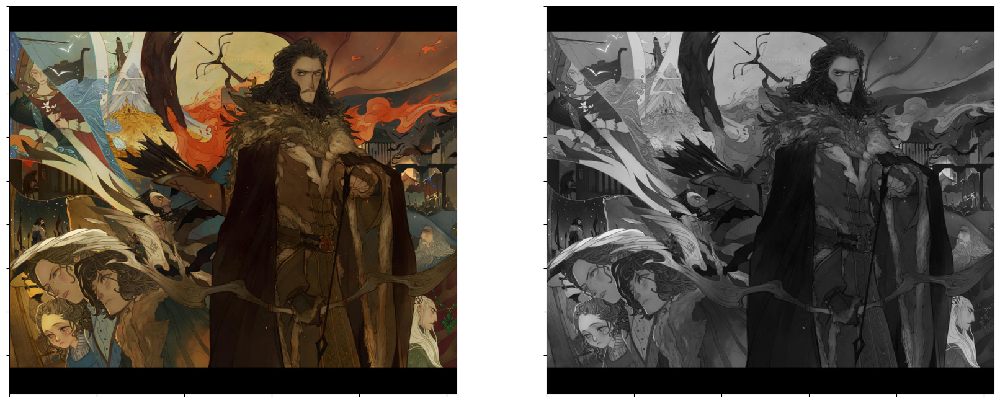

In [3]:
height, width, img, img_rgb, _ = load_image_and_show('../data/wavesheep1.jpg')

[12:45:06] INFO - Showing image ... (5.12 x 4.44)


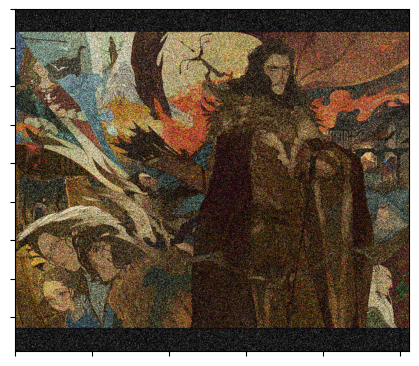

In [19]:
img_noise = cv.cvtColor(cv.imread('../data/wavesheep1-noisy.jpg'), cv.COLOR_BGR2RGB)
show_image(img_noise, scale = .5)


## 2D Convolution (Image Filtering)

In [4]:
?cv.filter2D

Docstring:
filter2D(src, ddepth, kernel[, dst[, anchor[, delta[, borderType]]]]) -> dst
.   @brief Convolves an image with the kernel.
.   
.   The function applies an arbitrary linear filter to an image. In-place operation is supported. When
.   the aperture is partially outside the image, the function interpolates outlier pixel values
.   according to the specified border mode.
.   
.   The function does actually compute correlation, not the convolution:
.   
.   \f[\texttt{dst} (x,y) =  \sum _{ \substack{0\leq x' < \texttt{kernel.cols}\\{0\leq y' < \texttt{kernel.rows}}}}  \texttt{kernel} (x',y')* \texttt{src} (x+x'- \texttt{anchor.x} ,y+y'- \texttt{anchor.y} )\f]
.   
.   That is, the kernel is not mirrored around the anchor point. If you need a real convolution, flip
.   the kernel using #flip and set the new anchor to `(kernel.cols - anchor.x - 1, kernel.rows -
.   anchor.y - 1)`.
.   
.   The function uses the DFT-based algorithm in case of sufficiently large kernels (~`11 x 11`

[12:33:41] INFO - Showing image ... (10.24 x 8.88)
[12:33:41] INFO - Showing image ... (10.24 x 8.88)


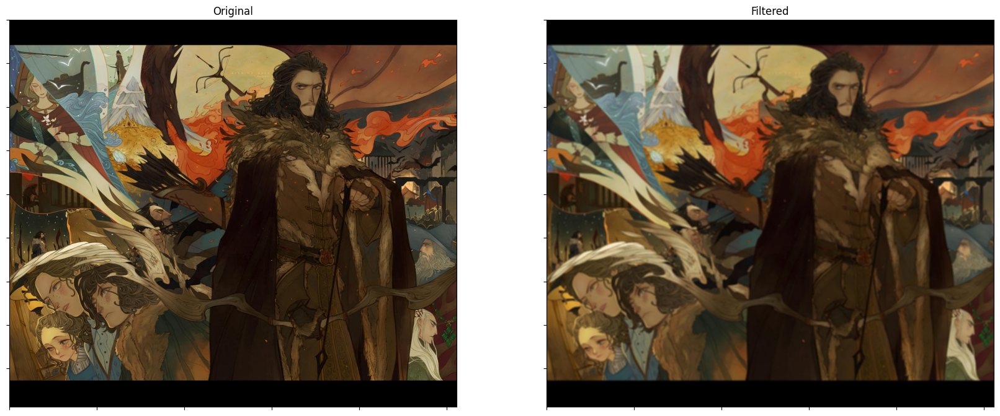

In [5]:
kernel = np.ones((5, 5), np.float32) / 25
dst = cv.filter2D(img_rgb, -1, kernel)

titles = ['Original', 'Filtered']
_, ax = plt.subplots(1, 2, figsize=(width*2/100, height/100))
for i, im in enumerate([img_rgb, dst]):
    show_image(im, ax=ax[i], title=titles[i])
plt.show()

So you can see how you can apply various sorts of custom filtering just by tweaking with the kernel
and the `cv.filter2D` setting.

## Image Blurring (Image Smoothing)

### Averaging

[12:36:59] INFO - Showing image ... (10.24 x 8.88)
[12:36:59] INFO - Showing image ... (10.24 x 8.88)


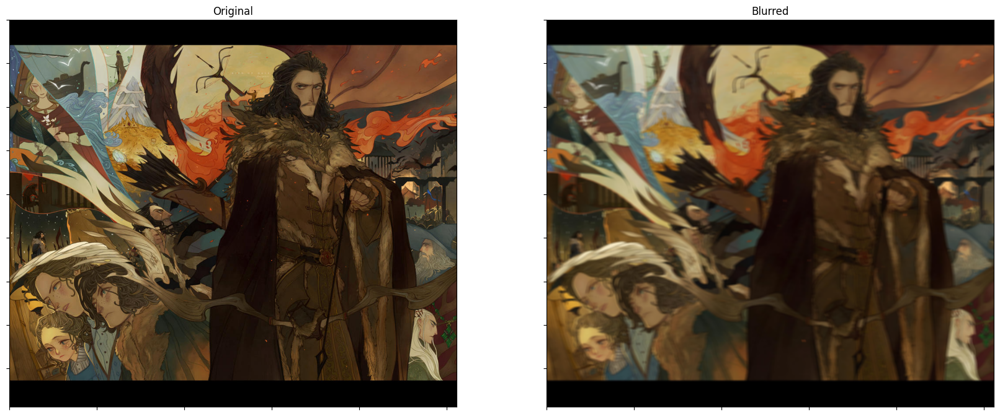

In [9]:
blur = cv.blur(img_rgb, (10, 5))

titles = ['Original', 'Blurred']
_, ax = plt.subplots(1, 2, figsize=(width*2/100, height/100))
for i, im in enumerate([img_rgb, blur]):
    show_image(im, ax=ax[i], title=titles[i])
plt.show()

### Gaussian Blurring

[12:41:15] INFO - Showing image ... (10.24 x 8.88)
[12:41:15] INFO - Showing image ... (10.24 x 8.88)


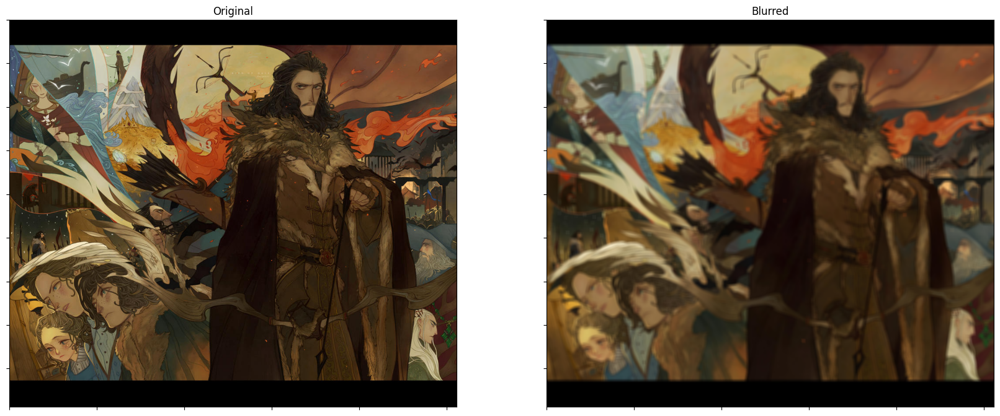

In [16]:
# using cv.GaussianBlur
blur = cv.GaussianBlur(img_rgb, (9, 9), 20)

titles = ['Original', 'Blurred']
_, ax = plt.subplots(1, 2, figsize=(width*2/100, height/100))
for i, im in enumerate([img_rgb, blur]):
    show_image(im, ax=ax[i], title=titles[i])
plt.show()

[12:40:54] INFO - Showing image ... (10.24 x 8.88)
[12:40:54] INFO - Showing image ... (10.24 x 8.88)


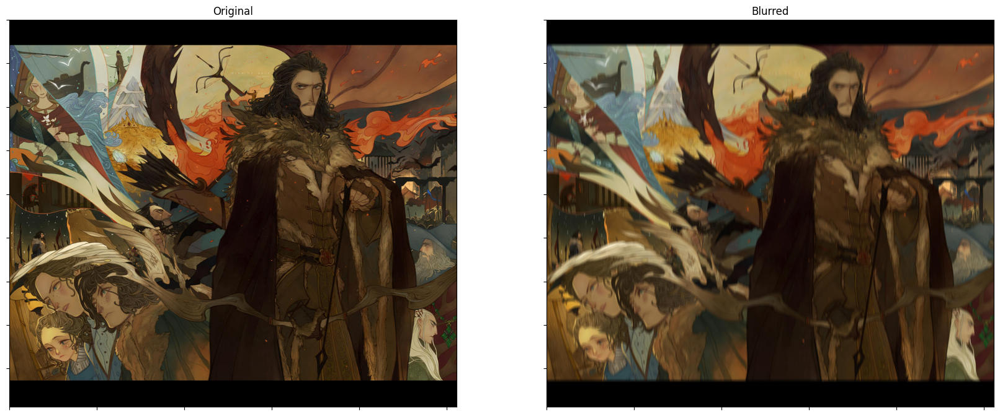

In [15]:
# Gaussian Blurring with cv.getGaussianKernel
kernel = cv.getGaussianKernel(9, 20)
dst = cv.filter2D(img_rgb, -1, kernel)

titles = ['Original', 'Blurred']
_, ax = plt.subplots(1, 2, figsize=(width*2/100, height/100))
for i, im in enumerate([img_rgb, dst]):
    show_image(im, ax=ax[i], title=titles[i])
plt.show()

### Median Blurring

[12:46:34] INFO - Showing image ... (10.24 x 8.88)
[12:46:34] INFO - Showing image ... (10.24 x 8.88)


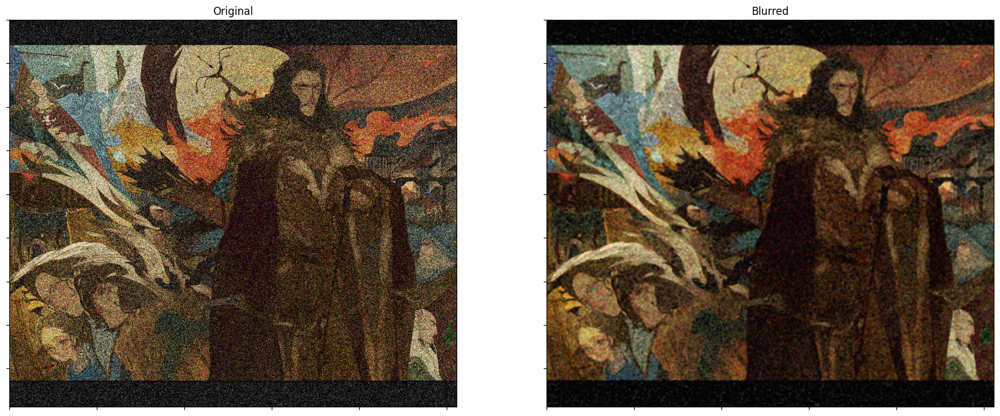

In [21]:
# Gaussian Blurring with cv.getGaussianKernel
blur = cv.medianBlur(img_noise, 5)

titles = ['Original', 'Blurred']
_, ax = plt.subplots(1, 2, figsize=(width*2/100, height/100))
for i, im in enumerate([img_noise, blur]):
    show_image(im, ax=ax[i], title=titles[i])
plt.show()


### Bilateral Filtering

[12:49:36] INFO - Showing image ... (10.24 x 8.88)
[12:49:36] INFO - Showing image ... (10.24 x 8.88)


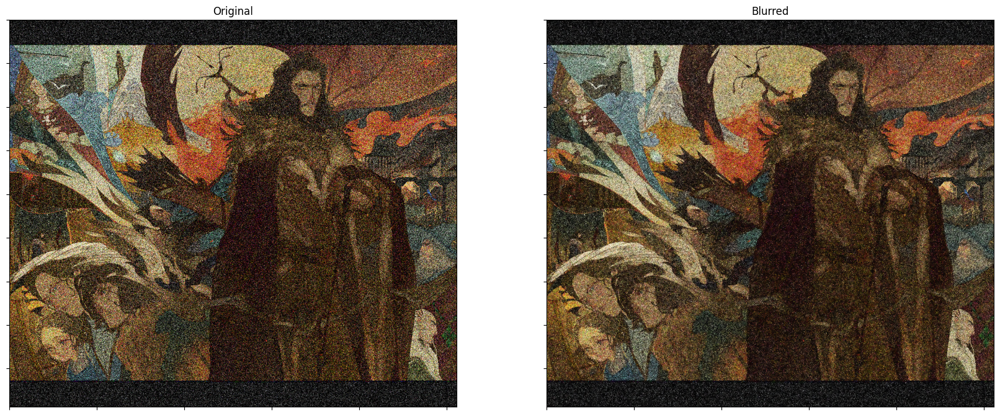

In [22]:
blur = cv.bilateralFilter(img_noise,9,75,75)

titles = ['Original', 'Blurred']
_, ax = plt.subplots(1, 2, figsize=(width*2/100, height/100))
for i, im in enumerate([img_noise, blur]):
    show_image(im, ax=ax[i], title=titles[i])
plt.show()


### 